In [2]:
!pip install pandas
!pip install numpy
!pip install pycaret
import pandas as pd
import numpy as np 
from pycaret.classification import *

     |████████████████████████████████| 264 kB 14.5 MB/s 
     |████████████████████████████████| 271 kB 26.9 MB/s 
     |████████████████████████████████| 6.8 MB 22.3 MB/s 
     |████████████████████████████████| 1.7 MB 56.5 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 167 kB 55.8 MB/s 
     |████████████████████████████████| 80 kB 8.2 MB/s 
     |████████████████████████████████| 1.3 MB 54.8 MB/s 
     |████████████████████████████████| 2.0 MB 56.9 MB/s 
     |████████████████████████████████| 105 kB 73.8 MB/s 
     |████████████████████████████████| 248 kB 85.2 MB/s 
     |████████████████████████████████| 56 kB 3.5 MB/s 
     |████████████████████████████████| 14.4 MB 61 kB/s 
     |████████████████████████████████| 10.1 MB 45.7 MB/s 
     |████████████████████████████████| 3.1 MB 88.8 MB/s 
     |█████████████████

In [3]:
!pip install category_encoders
import category_encoders as ce  
from sklearn.preprocessing import LabelEncoder
from sklearn.compose import ColumnTransformer
from sklearn.datasets import fetch_openml
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV

     |████████████████████████████████| 80 kB 5.1 MB/s 


In [4]:
from google.colab import files
upload = files.upload()



Saving Train_clean.csv to Train_clean.csv


In [5]:
upload2 = files.upload()

Saving Test_value_clean.csv to Test_value_clean.csv


In [6]:
upload1 = files.upload()

Saving Train value with labels.csv to Train value with labels.csv


In [167]:
Train = pd.read_csv('Train_clean.csv')
Test = pd.read_csv('Test_value_clean.csv')
Train_raw = pd.read_csv('Train value with labels.csv')

In [12]:
import pandas_profiling
pandas_profiling.ProfileReport(Train_raw)

Summarize dataset:   0%|          | 0/54 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [168]:
Train = Train.drop(Train.columns[[0,1]],axis=1)
Test = Test.drop(Test.columns[[0,1]],axis=1)

In [169]:
Train['date_recorded'] = pd.to_datetime(Train['date_recorded'])
sorted(Train["date_recorded"],reverse=True) # later day is 2013-12-03

[Timestamp('2013-12-03 00:00:00'),
 Timestamp('2013-12-03 00:00:00'),
 Timestamp('2013-12-03 00:00:00'),
 Timestamp('2013-12-03 00:00:00'),
 Timestamp('2013-12-03 00:00:00'),
 Timestamp('2013-12-03 00:00:00'),
 Timestamp('2013-12-03 00:00:00'),
 Timestamp('2013-12-03 00:00:00'),
 Timestamp('2013-12-03 00:00:00'),
 Timestamp('2013-12-03 00:00:00'),
 Timestamp('2013-12-03 00:00:00'),
 Timestamp('2013-12-03 00:00:00'),
 Timestamp('2013-12-03 00:00:00'),
 Timestamp('2013-12-03 00:00:00'),
 Timestamp('2013-12-03 00:00:00'),
 Timestamp('2013-12-03 00:00:00'),
 Timestamp('2013-12-03 00:00:00'),
 Timestamp('2013-12-03 00:00:00'),
 Timestamp('2013-12-03 00:00:00'),
 Timestamp('2013-12-03 00:00:00'),
 Timestamp('2013-12-03 00:00:00'),
 Timestamp('2013-12-03 00:00:00'),
 Timestamp('2013-12-03 00:00:00'),
 Timestamp('2013-12-03 00:00:00'),
 Timestamp('2013-12-03 00:00:00'),
 Timestamp('2013-12-03 00:00:00'),
 Timestamp('2013-12-03 00:00:00'),
 Timestamp('2013-12-03 00:00:00'),
 Timestamp('2013-12-

In [170]:
Train['Age'] = 2014 - Train['construction_year']
Test['Age'] = 2014 - Test['construction_year']

In [171]:
Train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 42 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   id                     59400 non-null  int64         
 1   amount_tsh             59400 non-null  float64       
 2   date_recorded          59400 non-null  datetime64[ns]
 3   funder                 59400 non-null  object        
 4   gps_height             59400 non-null  int64         
 5   installer              59400 non-null  object        
 6   longitude              59400 non-null  float64       
 7   latitude               59400 non-null  float64       
 8   wpt_name               59400 non-null  object        
 9   num_private            59400 non-null  int64         
 10  basin                  59400 non-null  object        
 11  subvillage             59400 non-null  object        
 12  region                 59400 non-null  object        
 13  r

In [172]:
Test.head()

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,Age
0,50785,0.0,2013-02-04,Dmdd,1996,DMDD,35.290799,-4.059696,Dinamu Secondary School,0.0,Internal,Magoma,Manyara,21,3,Mbulu,Bashay,321.0,True,GeoData Consultants Ltd,Parastatal,Other,True,2012,other,other,other,parastatal,parastatal,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,other,other,2
1,51630,0.0,2013-02-04,Government Of Tanzania,1569,DWE,36.656709,-3.309214,Kimnyak,0.0,Pangani,Kimnyak,Arusha,2,2,Arusha Rural,Kimnyaki,300.0,True,GeoData Consultants Ltd,VWC,TPRI pipe line,True,2000,gravity,gravity,gravity,vwc,user group,never pay,never pay,soft,good,insufficient,insufficient,spring,spring,groundwater,communal standpipe,communal standpipe,14
2,17168,0.0,2013-02-01,Government Of Tanzania,1567,DWE,34.767863,-5.004344,Puma Secondary,0.0,Internal,Msatu,Singida,13,2,Singida Rural,Puma,500.0,True,GeoData Consultants Ltd,VWC,Other,True,2010,other,other,other,vwc,user group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,other,other,4
3,45559,0.0,2013-01-22,Finn Water,267,FINN WATER,38.058046,-9.418672,Kwa Mzee Pange,0.0,Ruvuma and Southern Coast,Kipindimbi,Lindi,8,43,Liwale,Mkutano,250.0,True,GeoData Consultants Ltd,VWC,Other,True,1987,other,other,other,vwc,user group,unknown,unknown,soft,good,dry,dry,shallow well,shallow well,groundwater,other,other,27
4,49871,62.5,2013-03-27,Bruder,1260,BRUDER,35.006123,-10.950412,Kwa Mzee Turuka,0.0,Ruvuma and Southern Coast,Losonga,Ruvuma,10,3,Mbinga,Mbinga Urban,60.0,True,GeoData Consultants Ltd,Water Board,BRUDER,True,2000,gravity,gravity,gravity,water board,user group,pay monthly,monthly,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,14


In [173]:
Train['region'].value_counts()

Iringa           5294
Shinyanga        4982
Mbeya            4639
Kilimanjaro      4379
Morogoro         4006
Arusha           3350
Kagera           3316
Mwanza           3102
Kigoma           2816
Ruvuma           2640
Pwani            2635
Tanga            2547
Dodoma           2201
Singida          2093
Mara             1969
Tabora           1959
Rukwa            1808
Mtwara           1730
Manyara          1583
Lindi            1546
Dar es Salaam     805
Name: region, dtype: int64

In [ ]:
# East:  Dar es Salaam , Pwani，Morogoro，Arusha   #4
# South: Ruvuma, Mtwara   #2
# West: Rukwa,     #1  
# North: Mwanza, Mara, Kagera， Shinyanga  #4
# Northeast: Tanga , Kilimanjaro # 2
# Eastsouth: Lindi, Pwani   #2
# WestSouth:  Mbeya         #1
# Northwest: Kigoma, Tabora #2
# Middle:  Singida , Dodoma , Iringa   #3

In [174]:
Train['Area'] = Train['region']
Test['Area'] = Test['region']

In [175]:
Train['Area'].loc[(Train['Area'] == 'Dar es Salaam') | (Train['Area'] == 'Pwani') | (Train['Area'] == 'Morogoro') | (Train['Area'] == 'Arusha') ] = 'East'
Train['Area'].loc[(Train['Area'] == 'Ruvuma') | (Train['Area'] == 'Mtwara')] = 'South'
Train['Area'].loc[(Train['Area'] == 'Rukwa')] = 'West'
Train['Area'].loc[(Train['Area'] == 'Mwanza') | (Train['Area'] == 'Mara') | (Train['Area'] == 'Kagera') | (Train['Area'] == 'Shinyanga') ] = 'North'
Train['Area'].loc[(Train['Area'] == 'Tanga') | (Train['Area'] == 'Kilimanjaro')] = 'Northeast'
Train['Area'].loc[(Train['Area'] == 'Lindi') | (Train['Area'] == 'Pwani')] = 'Eastsouth'
Train['Area'].loc[(Train['Area'] == 'Mbeya')] = 'WestSouth'
Train['Area'].loc[(Train['Area'] == 'Kigoma') | (Train['Area'] == 'Tabora')] = 'Northwest'
Train['Area'].loc[(Train['Area'] == 'Singida') | (Train['Area'] == 'Dodoma') | (Train['Area'] == 'Iringa')] = 'Middle'


In [176]:
Test['Area'].loc[(Test['Area'] == 'Dar es Salaam') | (Test['Area'] == 'Pwani') | (Test['Area'] == 'Morogoro') | (Test['Area'] == 'Arusha') ] = 'East'
Test['Area'].loc[(Test['Area'] == 'Ruvuma') | (Test['Area'] == 'Mtwara')] = 'South'
Test['Area'].loc[(Test['Area'] == 'Rukwa')] = 'West'
Test['Area'].loc[(Test['Area'] == 'Mwanza') | (Test['Area'] == 'Mara') | (Test['Area'] == 'Kagera') | (Test['Area'] == 'Shinyanga') ] = 'North'
Test['Area'].loc[(Test['Area'] == 'Tanga') | (Test['Area'] == 'Kilimanjaro')] = 'Northeast'
Test['Area'].loc[(Test['Area'] == 'Lindi') | (Test['Area'] == 'Pwani')] = 'Eastsouth'
Test['Area'].loc[(Test['Area'] == 'Mbeya')] = 'WestSouth'
Test['Area'].loc[(Test['Area'] == 'Kigoma') | (Test['Area'] == 'Tabora')] = 'Northwest'
Test['Area'].loc[(Test['Area'] == 'Singida') | (Test['Area'] == 'Dodoma') | (Test['Area'] == 'Iringa')] = 'Middle'

In [177]:
Train['Area'].value_counts()

North        13369
East         10796
Middle        9588
Northeast     6926
Northwest     4775
WestSouth     4639
South         4370
West          1808
Manyara       1583
Eastsouth     1546
Name: Area, dtype: int64

In [178]:
Test['Area'].value_counts()

North        3446
East         2704
Middle       2326
Northeast    1754
Northwest    1224
WestSouth    1119
South        1080
West          434
Manyara       389
Eastsouth     374
Name: Area, dtype: int64

In [179]:
Train.isnull().sum()

id                       0
amount_tsh               0
date_recorded            0
funder                   0
gps_height               0
installer                0
longitude                0
latitude                 0
wpt_name                 0
num_private              0
basin                    0
subvillage               0
region                   0
region_code              0
district_code            0
lga                      0
ward                     0
population               0
public_meeting           0
recorded_by              0
scheme_management        0
scheme_name              0
permit                   0
construction_year        0
extraction_type          0
extraction_type_group    0
extraction_type_class    0
management               0
management_group         0
payment                  0
payment_type             0
water_quality            0
quality_group            0
quantity                 0
quantity_group           0
source                   0
source_type              0
s

In [180]:
Test.isnull().sum()

id                       0
amount_tsh               0
date_recorded            0
funder                   0
gps_height               0
installer                0
longitude                0
latitude                 0
wpt_name                 0
num_private              0
basin                    0
subvillage               0
region                   0
region_code              0
district_code            0
lga                      0
ward                     0
population               0
public_meeting           0
recorded_by              0
scheme_management        0
scheme_name              0
permit                   0
construction_year        0
extraction_type          0
extraction_type_group    0
extraction_type_class    0
management               0
management_group         0
payment                  0
payment_type             0
water_quality            0
quality_group            0
quantity                 0
quantity_group           0
source                   0
source_type              0
s

In [181]:
#Train = Train[['quantity_group','waterpoint_type_group','extraction_type_class','population','construction_year','funder','payment_type','source_type','gps_height',"status_group"]]
#Test = Test[['quantity_group','waterpoint_type_group','extraction_type_class','population','construction_year','funder','payment_type','source_type','gps_height']]      
Train = Train[['id','quantity','construction_year','waterpoint_type','funder','lga','subvillage','gps_height','installer','population','Age','Area',"status_group"]]
Test = Test[['id','quantity','construction_year','waterpoint_type','funder','lga','subvillage','gps_height','installer','population','Age','Area',]]


In [182]:
Train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 59400 non-null  int64  
 1   quantity           59400 non-null  object 
 2   construction_year  59400 non-null  int64  
 3   waterpoint_type    59400 non-null  object 
 4   funder             59400 non-null  object 
 5   lga                59400 non-null  object 
 6   subvillage         59400 non-null  object 
 7   gps_height         59400 non-null  int64  
 8   installer          59400 non-null  object 
 9   population         59400 non-null  float64
 10  Age                59400 non-null  int64  
 11  Area               59400 non-null  object 
 12  status_group       59400 non-null  object 
dtypes: float64(1), int64(4), object(8)
memory usage: 5.9+ MB


In [183]:
Test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14850 entries, 0 to 14849
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 14850 non-null  int64  
 1   quantity           14850 non-null  object 
 2   construction_year  14850 non-null  int64  
 3   waterpoint_type    14850 non-null  object 
 4   funder             14850 non-null  object 
 5   lga                14850 non-null  object 
 6   subvillage         14850 non-null  object 
 7   gps_height         14850 non-null  int64  
 8   installer          14850 non-null  object 
 9   population         14850 non-null  float64
 10  Age                14850 non-null  int64  
 11  Area               14850 non-null  object 
dtypes: float64(1), int64(4), object(7)
memory usage: 1.4+ MB


In [184]:
# Function to set up # of category for features
test_cat = 20
def max_cat_test(col):
    if len(Train[col].value_counts()) > (test_cat):
        top_value = Train[col].value_counts()[:(test_cat)].index.tolist()
        Train.loc[-Train[col].isin(top_value),col]='Others'
                
    return Train

def max_cat_test(col):
    if len(Test[col].value_counts()) > (test_cat):
        top_value = Test[col].value_counts()[:(test_cat)].index.tolist()
        Test.loc[-Test[col].isin(top_value),col]='Others'
                
    return Test

In [185]:
max_cat('lga')
max_cat('subvillage')
max_cat('installer')
max_cat('quantity')
max_cat('waterpoint_type')
max_cat('funder')
max_cat('Area')

,id,quantity,construction_year,waterpoint_type,funder,lga,subvillage,gps_height,installer,population,Age,Area,status_group
0,69572,enough,1999,communal standpipe,Others,Others,Others,1390,Others,109.0,15,Middle,functional
1,8776,insufficient,2010,communal standpipe,Others,Others,Others,1399,Others,280.0,4,North,functional
2,34310,enough,2009,communal standpipe multiple,Others,Others,Majengo,686,World vision,250.0,5,Manyara,functional
3,67743,dry,1986,communal standpipe multiple,Unicef,Others,Others,263,Others,58.0,28,South,non functional
4,19728,seasonal,1998,communal standpipe,Others,Karagwe,Others,0,Others,0.0,16,North,functional
...,...,...,...,...,...,...,...,...,...,...,...,...,...
59395,60739,enough,1999,communal standpipe,Germany Republi,Others,Others,1210,CES,125.0,15,Northeast,functional
59396,27263,enough,1996,communal standpipe,Others,Njombe,Others,1212,Others,56.0,18,Middle,functional
59397,37057,enough,1989,hand pump,Government Of Tanzania,Others,Others,0,DWE,0.0,25,WestSouth,functional
59398,31282,insufficient,1995,hand pump,Others,Others,Others,0,Others,0.0,19,Middle,functional


In [186]:
max_cat_test('lga')
max_cat_test('subvillage')
max_cat_test('installer')
max_cat_test('quantity')
max_cat_test('waterpoint_type')
max_cat_test('funder')
max_cat_test('Area')

,id,quantity,construction_year,waterpoint_type,funder,lga,subvillage,gps_height,installer,population,Age,Area
0,50785,seasonal,2012,other,Others,Others,Others,1996,Others,321.0,2,Manyara
1,51630,insufficient,2000,communal standpipe,Government Of Tanzania,Arusha Rural,Others,1569,DWE,300.0,14,East
2,17168,insufficient,2010,other,Government Of Tanzania,Singida Rural,Others,1567,DWE,500.0,4,Middle
3,45559,dry,1987,other,Others,Others,Others,267,Others,250.0,27,Eastsouth
4,49871,enough,2000,communal standpipe,Others,Mbinga,Others,1260,Others,60.0,14,South
...,...,...,...,...,...,...,...,...,...,...,...,...
14845,39307,enough,1988,communal standpipe,Danida,Bagamoyo,Others,34,Others,20.0,26,East
14846,18990,insufficient,1994,hand pump,Others,Others,Others,0,Others,550.0,20,Northeast
14847,28749,insufficient,2010,communal standpipe,Government Of Tanzania,Singida Rural,Others,1476,DWE,200.0,4,Middle
14848,33492,insufficient,2009,communal standpipe,Others,Others,Others,998,DWE,150.0,5,South


In [187]:
from sklearn.preprocessing import PolynomialFeatures

poly = PolynomialFeatures()
to_cross = ['construction_year', 'gps_height', 'population','Age']
crossed_feats = poly.fit_transform(Train[to_cross].values)
crossed_feats_test = poly.fit_transform(Test[to_cross].values)

In [188]:
crossed_feats = pd.DataFrame(crossed_feats)
Train = pd.concat([Train, crossed_feats], axis=1)
crossed_feats_test = pd.DataFrame(crossed_feats_test)
Test = pd.concat([Test, crossed_feats_test], axis=1)

In [189]:
Train[Train.select_dtypes(['object']).columns] = Train.select_dtypes(['object']).apply(lambda x: x.astype('category'))
Test[Test.select_dtypes(['object']).columns] =Test.select_dtypes(['object']).apply(lambda x: x.astype('category'))

In [190]:
#Label Ordinal Encoding
#Train['quantity'] = Train['quantiy'].cat.codes
Train['waterpoint_type'] = Train['waterpoint_type'].cat.codes
Train['funder'] = Train['funder'].cat.codes
Train['lga'] = Train['lga'].cat.codes
Train['subvillage'] = Train['subvillage'].cat.codes
Train['installer'] = Train['installer'].cat.codes
Train['Area'] = Train['Area'].cat.codes


In [191]:
Test['waterpoint_type'] = Test['waterpoint_type'].cat.codes
Test['funder'] = Test['funder'].cat.codes
Test['lga'] = Test['lga'].cat.codes
Test['subvillage'] = Test['subvillage'].cat.codes
Test['installer'] = Test['installer'].cat.codes
Test['Area'] = Test['Area'].cat.codes

In [165]:
Train_data

,id,quantity,construction_year,waterpoint_type,funder,lga,subvillage,gps_height,installer,population,Age,Area,status_group,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,69572,enough,1999,1,11,17,17,1390,14,109.0,15,3,functional,1.0,1999.0,1390.0,109.0,15.0,3996001.0,2778610.0,217891.0,29985.0,1932100.0,151510.0,20850.0,11881.00,1635.0,225.0,1.0,1999.0,1390.0,109.0,15.0,3996001.0,2778610.0,217891.0,29985.0,1932100.0,151510.0,20850.0,11881.00,1635.0,225.0
1,8776,insufficient,2010,1,11,17,17,1399,14,280.0,4,4,functional,1.0,2010.0,1399.0,280.0,4.0,4040100.0,2811990.0,562800.0,8040.0,1957201.0,391720.0,5596.0,78400.00,1120.0,16.0,1.0,2010.0,1399.0,280.0,4.0,4040100.0,2811990.0,562800.0,8040.0,1957201.0,391720.0,5596.0,78400.00,1120.0,16.0
2,34310,enough,2009,2,11,17,4,686,20,250.0,5,2,functional,1.0,2009.0,686.0,250.0,5.0,4036081.0,1378174.0,502250.0,10045.0,470596.0,171500.0,3430.0,62500.00,1250.0,25.0,1.0,2009.0,686.0,250.0,5.0,4036081.0,1378174.0,502250.0,10045.0,470596.0,171500.0,3430.0,62500.00,1250.0,25.0
3,67743,dry,1986,2,16,17,17,263,14,58.0,28,7,non functional,1.0,1986.0,263.0,58.0,28.0,3944196.0,522318.0,115188.0,55608.0,69169.0,15254.0,7364.0,3364.00,1624.0,784.0,1.0,1986.0,263.0,58.0,28.0,3944196.0,522318.0,115188.0,55608.0,69169.0,15254.0,7364.0,3364.00,1624.0,784.0
4,19728,seasonal,1998,1,11,4,17,0,14,0.0,16,4,functional,1.0,1998.0,0.0,0.0,16.0,3992004.0,0.0,0.0,31968.0,0.0,0.0,0.0,0.00,0.0,256.0,1.0,1998.0,0.0,0.0,16.0,3992004.0,0.0,0.0,31968.0,0.0,0.0,0.0,0.00,0.0,256.0
5,9944,enough,2009,2,11,17,17,0,6,1.0,5,5,functional,1.0,2009.0,0.0,1.0,5.0,4036081.0,0.0,2009.0,10045.0,0.0,0.0,0.0,1.00,5.0,25.0,1.0,2009.0,0.0,1.0,5.0,4036081.0,0.0,2009.0,10045.0,0.0,0.0,0.0,1.00,5.0,25.0
6,19816,enough,1997,4,4,17,17,0,14,0.0,17,4,non functional,1.0,1997.0,0.0,0.0,17.0,3988009.0,0.0,0.0,33949.0,0.0,0.0,0.0,0.00,0.0,289.0,1.0,1997.0,0.0,0.0,17.0,3988009.0,0.0,0.0,33949.0,0.0,0.0,0.0,0.00,0.0,289.0
7,54551,enough,1997,4,13,3,17,0,6,0.0,17,4,non functional,1.0,1997.0,0.0,0.0,17.0,3988009.0,0.0,0.0,33949.0,0.0,0.0,0.0,0.00,0.0,289.0,1.0,1997.0,0.0,0.0,17.0,3988009.0,0.0,0.0,33949.0,0.0,0.0,0.0,0.00,0.0,289.0
8,53934,seasonal,1996,4,11,17,17,0,14,0.0,18,6,non functional,1.0,1996.0,0.0,0.0,18.0,3984016.0,0.0,0.0,35928.0,0.0,0.0,0.0,0.00,0.0,324.0,1.0,1996.0,0.0,0.0,18.0,3984016.0,0.0,0.0,35928.0,0.0,0.0,0.0,0.00,0.0,324.0
9,46144,enough,1998,4,11,4,17,0,14,0.0,16,4,functional,1.0,1998.0,0.0,0.0,16.0,3992004.0,0.0,0.0,31968.0,0.0,0.0,0.0,0.00,0.0,256.0,1.0,1998.0,0.0,0.0,16.0,3992004.0,0.0,0.0,31968.0,0.0,0.0,0.0,0.00,0.0,256.0


In [ ]:
Train.info()
Test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 59400 non-null  int64  
 1   quantity           59400 non-null  object 
 2   construction_year  59400 non-null  int64  
 3   waterpoint_type    59400 non-null  object 
 4   funder             59400 non-null  object 
 5   lga                59400 non-null  object 
 6   subvillage         59400 non-null  object 
 7   gps_height         59400 non-null  int64  
 8   installer          59400 non-null  object 
 9   population         59400 non-null  float64
 10  status_group       59400 non-null  object 
dtypes: float64(1), int64(3), object(7)
memory usage: 5.0+ MB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14850 entries, 0 to 14849
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  


In [192]:
clf1 = setup(Train, target = 'status_group', session_id=123, log_experiment=True, experiment_name='pump')

,Description,Value
0,session_id,123
1,Target,status_group
2,Target Type,Multiclass
3,Label Encoded,"functional: 0, functional needs repair: 1, non..."
4,Original Data,"(59400, 28)"
5,Missing Values,False
6,Numeric Features,26
7,Categorical Features,1
8,Ordinal Features,False
9,High Cardinality Features,False


In [193]:
best_model = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.7514,0.8539,0.5556,0.7537,0.7289,0.5107,0.5331,1.049
rf,Random Forest Classifier,0.7431,0.8427,0.5912,0.7323,0.7350,0.5182,0.5209,4.637
et,Extra Trees Classifier,0.7381,0.8257,0.5962,0.7296,0.7325,0.5135,0.5148,3.736
gbc,Gradient Boosting Classifier,0.7311,0.8252,0.5228,0.7361,0.7021,0.4637,0.4948,17.388
ada,Ada Boost Classifier,0.7122,0.7856,0.4918,0.6938,0.6768,0.4222,0.4532,1.368
dt,Decision Tree Classifier,0.6866,0.7211,0.5697,0.6883,0.6874,0.4329,0.4329,0.299
ridge,Ridge Classifier,0.6865,0.0000,0.4656,0.6611,0.6439,0.3606,0.4052,0.042
lda,Linear Discriminant Analysis,0.6859,0.7558,0.4643,0.6639,0.6422,0.3579,0.4061,0.105
nb,Naive Bayes,0.5844,0.6333,0.3831,0.5466,0.5223,0.1396,0.1699,0.034
lr,Logistic Regression,0.5801,0.6183,0.3829,0.5290,0.5256,0.1377,0.1592,9.495


In [194]:
rf = create_model('rf') #0.7350


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7480,0.8512,0.5950,0.7369,0.7398,0.5275,0.5299
1,0.7431,0.8445,0.5802,0.7300,0.7329,0.5153,0.5188
2,0.7453,0.8382,0.6048,0.7368,0.7385,0.5235,0.5263
3,0.7415,0.8345,0.5858,0.7309,0.7332,0.5144,0.5177
4,0.7439,0.8517,0.5885,0.7320,0.7355,0.5198,0.5220
5,0.7511,0.8505,0.6060,0.7415,0.7433,0.5329,0.5355
6,0.7318,0.8336,0.5738,0.7200,0.7239,0.4985,0.5006
7,0.7359,0.8337,0.5792,0.7246,0.7268,0.5029,0.5065
8,0.7391,0.8410,0.5907,0.7283,0.7314,0.5118,0.5139
9,0.7515,0.8482,0.6079,0.7423,0.7447,0.5356,0.5377


In [195]:
et = create_model('et') #0.7325

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7388,0.8325,0.5937,0.7295,0.7330,0.5152,0.5162
1,0.7412,0.8271,0.5916,0.7304,0.7337,0.5162,0.5181
2,0.7407,0.8216,0.6096,0.7344,0.7363,0.5194,0.5208
3,0.7376,0.8189,0.5959,0.7301,0.7321,0.5115,0.5136
4,0.7439,0.8327,0.5966,0.7338,0.7375,0.5237,0.5248
5,0.7456,0.8335,0.6090,0.7372,0.7399,0.5269,0.5282
6,0.7251,0.8194,0.5735,0.7160,0.7195,0.4902,0.4914
7,0.7309,0.8190,0.5875,0.7224,0.7250,0.4992,0.5009
8,0.7383,0.8229,0.5985,0.7298,0.7331,0.5153,0.5161
9,0.7385,0.8296,0.6065,0.7326,0.7349,0.5174,0.5181


In [196]:
lightgbm = create_model('lightgbm') #0.7551

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7523,0.8518,0.5580,0.7509,0.7309,0.5143,0.5335
1,0.7496,0.8551,0.5517,0.7530,0.7266,0.5062,0.5298
2,0.7528,0.8562,0.5617,0.7603,0.7306,0.5131,0.5360
3,0.7434,0.8460,0.5458,0.7485,0.7195,0.4924,0.5186
4,0.7581,0.8576,0.5569,0.7593,0.7346,0.5239,0.5448
5,0.7557,0.8618,0.5555,0.7590,0.7323,0.5183,0.5416
6,0.7482,0.8485,0.5484,0.7476,0.7246,0.5032,0.5289
7,0.7434,0.8473,0.5514,0.7421,0.7217,0.4958,0.5181
8,0.7516,0.8530,0.5614,0.7513,0.7307,0.5132,0.5326
9,0.7590,0.8614,0.5653,0.7648,0.7375,0.5264,0.5470


In [ ]:
models()

,Name,Reference,Turbo
ID,,,
lr,Logistic Regression,sklearn.linear_model._logistic.LogisticRegression,True
knn,K Neighbors Classifier,sklearn.neighbors._classification.KNeighborsCl...,True
nb,Naive Bayes,sklearn.naive_bayes.GaussianNB,True
dt,Decision Tree Classifier,sklearn.tree._classes.DecisionTreeClassifier,True
svm,SVM - Linear Kernel,sklearn.linear_model._stochastic_gradient.SGDC...,True
rbfsvm,SVM - Radial Kernel,sklearn.svm._classes.SVC,False
gpc,Gaussian Process Classifier,sklearn.gaussian_process._gpc.GaussianProcessC...,False
mlp,MLP Classifier,sklearn.neural_network._multilayer_perceptron....,False
ridge,Ridge Classifier,sklearn.linear_model._ridge.RidgeClassifier,True


In [197]:
tuned_et = tune_model(et) # 0.6634

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7047,0.7832,0.4776,0.6904,0.6612,0.3951,0.4517
1,0.7042,0.7911,0.4774,0.6893,0.6609,0.3943,0.4502
2,0.7073,0.7901,0.4795,0.6928,0.6639,0.4006,0.4576
3,0.7001,0.7822,0.4725,0.6944,0.6542,0.3826,0.4474
4,0.7165,0.7966,0.4874,0.6992,0.6749,0.4209,0.4749
5,0.7049,0.7947,0.4777,0.6917,0.6612,0.3952,0.4531
6,0.7061,0.7886,0.4774,0.6970,0.6609,0.3961,0.4593
7,0.6941,0.7792,0.4693,0.6792,0.6493,0.3725,0.4286
8,0.7152,0.7853,0.4866,0.7000,0.6735,0.4182,0.4735
9,0.7157,0.7959,0.4865,0.7023,0.6738,0.4184,0.4753


In [198]:
tuned_rf = tune_model(rf) # 0.6680

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7119,0.7473,0.4844,0.6940,0.6705,0.4119,0.4644
1,0.7068,0.7544,0.4808,0.6861,0.6654,0.4021,0.4518
2,0.7155,0.7559,0.4873,0.6949,0.6743,0.4201,0.4710
3,0.7054,0.7452,0.4782,0.6923,0.6621,0.3964,0.4537
4,0.7174,0.7607,0.4886,0.6962,0.6762,0.4240,0.4749
5,0.7100,0.7579,0.4831,0.6912,0.6685,0.4081,0.4598
6,0.7083,0.7388,0.4791,0.6988,0.6633,0.4008,0.4638
7,0.6975,0.7388,0.4713,0.6842,0.6521,0.3789,0.4376
8,0.7155,0.7510,0.4874,0.6976,0.6745,0.4197,0.4721
9,0.7149,0.7581,0.4856,0.7029,0.6727,0.4164,0.4747


In [199]:
tuned_lightgbm = tune_model(lightgbm) # 0.7366

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7573,0.8584,0.5736,0.7511,0.7399,0.5298,0.5417
1,0.7559,0.8610,0.5679,0.7543,0.7367,0.5238,0.5395
2,0.7504,0.8603,0.5666,0.7526,0.7311,0.5123,0.5288
3,0.7443,0.8519,0.5545,0.7380,0.7243,0.5008,0.5177
4,0.7626,0.8639,0.5649,0.7581,0.7414,0.5365,0.5518
5,0.7597,0.8665,0.5744,0.7581,0.7413,0.5321,0.5476
6,0.7544,0.8527,0.5658,0.7472,0.7358,0.5222,0.5387
7,0.7492,0.8529,0.5570,0.7409,0.7293,0.5108,0.5279
8,0.7528,0.8577,0.5697,0.7469,0.7347,0.5202,0.5333
9,0.7688,0.8683,0.5847,0.7672,0.7513,0.5508,0.5651


In [200]:
bagged_rf = ensemble_model(rf) #0.7434

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7532,0.8585,0.5879,0.7416,0.7415,0.5309,0.5364
1,0.7571,0.8552,0.5782,0.7445,0.7422,0.5343,0.5422
2,0.7561,0.8497,0.5874,0.7458,0.7427,0.5334,0.5414
3,0.7540,0.8456,0.5847,0.7426,0.7414,0.5307,0.5379
4,0.7607,0.8590,0.5871,0.7484,0.7474,0.5431,0.5498
5,0.7658,0.8611,0.6015,0.7568,0.7538,0.5532,0.5602
6,0.7480,0.8453,0.5770,0.7346,0.7359,0.5212,0.5268
7,0.7468,0.8435,0.5729,0.7343,0.7327,0.5154,0.5236
8,0.7544,0.8509,0.5865,0.7424,0.7418,0.5322,0.5385
9,0.7652,0.8598,0.6083,0.7571,0.7546,0.5536,0.5596


In [201]:
boosted_rf = ensemble_model(rf, method = 'Boosting')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7436,0.8424,0.5804,0.7303,0.7330,0.5158,0.5193
1,0.7424,0.8435,0.5806,0.7296,0.7324,0.5142,0.5176
2,0.7460,0.8388,0.6036,0.7375,0.7391,0.5245,0.5274
3,0.7393,0.8296,0.5761,0.7265,0.7285,0.5066,0.5110
4,0.7487,0.8515,0.5850,0.7353,0.7389,0.5269,0.5299
5,0.7525,0.8450,0.5999,0.7419,0.7435,0.5338,0.5372
6,0.7379,0.8326,0.5746,0.7246,0.7284,0.5073,0.5102
7,0.7347,0.8334,0.5735,0.7224,0.7248,0.4996,0.5035
8,0.7386,0.8413,0.5885,0.7272,0.7304,0.5102,0.5123
9,0.7450,0.8400,0.5977,0.7349,0.7366,0.5206,0.5234


In [202]:
bagged_et = ensemble_model(et) #0.7398


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7501,0.8531,0.6043,0.7406,0.7425,0.5314,0.5340
1,0.7470,0.8503,0.5828,0.7338,0.7365,0.5223,0.5259
2,0.7504,0.8432,0.6031,0.7409,0.7418,0.5298,0.5337
3,0.7470,0.8404,0.5937,0.7369,0.7384,0.5238,0.5276
4,0.7532,0.8537,0.5900,0.7402,0.7435,0.5355,0.5385
5,0.7605,0.8557,0.6129,0.7512,0.7521,0.5493,0.5527
6,0.7347,0.8396,0.5799,0.7244,0.7273,0.5038,0.5063
7,0.7395,0.8394,0.5818,0.7281,0.7305,0.5100,0.5136
8,0.7482,0.8441,0.5960,0.7370,0.7397,0.5273,0.5300
9,0.7534,0.8525,0.6061,0.7435,0.7461,0.5386,0.5408


In [203]:
boosted_et = ensemble_model(et, method = 'Boosting')


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7410,0.8314,0.5958,0.7313,0.7347,0.5180,0.5193
1,0.7429,0.8274,0.5948,0.7326,0.7359,0.5201,0.5218
2,0.7381,0.8200,0.6068,0.7317,0.7337,0.5147,0.5161
3,0.7352,0.8173,0.5953,0.7281,0.7300,0.5075,0.5094
4,0.7412,0.8331,0.5948,0.7314,0.7352,0.5194,0.5204
5,0.7482,0.8332,0.6119,0.7399,0.7426,0.5318,0.5331
6,0.7251,0.8195,0.5754,0.7167,0.7200,0.4909,0.4919
7,0.7299,0.8176,0.5867,0.7214,0.7240,0.4974,0.4991
8,0.7376,0.8206,0.5968,0.7289,0.7322,0.5134,0.5144
9,0.7376,0.8294,0.6022,0.7308,0.7334,0.5149,0.5157


In [ ]:
bagged_lightgbm = ensemble_model(lightgbm) #0.7529

IntProgress(value=0, description='Processing: ', max=6)

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,04:45:46
Status,. . . . . . . . . . . . . . . . . .,Fitting 10 Folds
Estimator,. . . . . . . . . . . . . . . . . .,Light Gradient Boosting Machine


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC


In [ ]:

boosted_lightgbm = ensemble_model(lightgbm, method = 'Boosting')

In [ ]:
blender = blend_models(estimator_list = [bagged_lightgbm,rf,et], method ='soft')#

In [ ]:
stacker = stack_models(estimator_list = [bagged_rf, bagged_et], meta_model=lightgbm)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.6000,0.7334,0.4218,0.5422,0.5660,0.2314,0.2387
1,0.5714,0.6688,0.3937,0.5261,0.5277,0.1532,0.1702
2,0.6714,0.7300,0.4668,0.6242,0.6267,0.3534,0.3867
3,0.8000,0.8825,0.5746,0.7397,0.7634,0.6157,0.6353
4,0.6571,0.7477,0.4645,0.6099,0.6221,0.3333,0.3521
5,0.6286,0.7367,0.4398,0.5784,0.5901,0.2749,0.2934
6,0.7857,0.8331,0.5589,0.7373,0.7479,0.5833,0.6161
7,0.7143,0.8023,0.5034,0.6675,0.6821,0.4453,0.4623
8,0.6286,0.7625,0.4467,0.6031,0.6115,0.3000,0.3051
9,0.7101,0.7908,0.4946,0.6657,0.6792,0.4228,0.4402


findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif


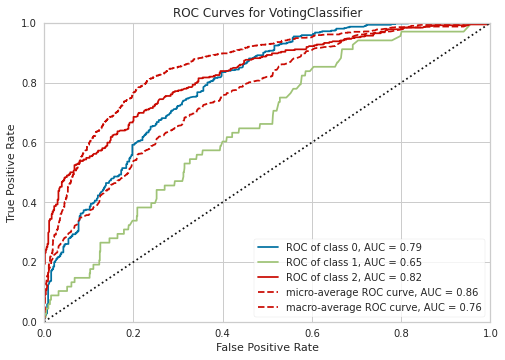

In [ ]:
plot_model(blender)

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif


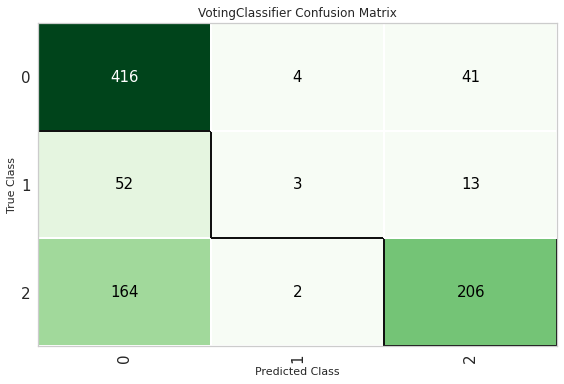

In [ ]:
plot_model(blender, plot = 'confusion_matrix')

In [ ]:
evaluate_model(blender)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [ ]:
best = automl(optimize = 'AUC')
best

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=123, verbose=0,
                       warm_start=False)

In [ ]:
pred_holdouts = predict_model(blender)
pred_holdouts.head()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Voting Classifier,0.6937,0.7948,0.5001,0.6891,0.6645,0.4123,0.4399


,construction_year,gps_height,quantity_dry,quantity_enough,quantity_insufficient,quantity_seasonal,quantity_unknown,ward_Akheri,ward_Badi,ward_Balangidalalu,...,subvillage_Zahani,subvillage_Zaire,subvillage_Zambia,subvillage_Zingibali,subvillage_Zobogo,subvillage_Zomba A,subvillage_Zombengalawa,status_group,Label,Score
0,1980.0,874.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,functional,functional,0.7627
1,1997.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,functional,functional,0.6855
2,2000.0,30.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,non functional,functional,0.9180
3,1996.0,1179.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,non functional,non functional,0.9505
4,1995.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,non functional,non functional,0.5525


In [ ]:
predict_test = predict_model(best, data = Test)
predict_test

,quantity,construction_year,ward,waterpoint_type,funder,lga,subvillage,gps_height,Label,Score
0,seasonal,2012,Bashay,other,Dmdd,Mbulu,Magoma,1996,functional,0.57
1,insufficient,2000,Kimnyaki,communal standpipe,Government Of Tanzania,Arusha Rural,Kimnyak,1569,functional,0.59
2,insufficient,2010,Puma,other,Government Of Tanzania,Singida Rural,Msatu,1567,non functional,0.59
3,dry,1987,Mkutano,other,Finn Water,Liwale,Kipindimbi,267,non functional,1.00
4,enough,2000,Mbinga Urban,communal standpipe,Bruder,Mbinga,Losonga,1260,functional,0.60
...,...,...,...,...,...,...,...,...,...,...
14845,enough,1988,Yombo,communal standpipe,Danida,Bagamoyo,Yombo,34,functional,0.70
14846,insufficient,1994,Mvungwe,hand pump,Hiap,Kilindi,Mkondoa,0,functional,0.75
14847,insufficient,2010,Ughandi,communal standpipe,Government Of Tanzania,Singida Rural,Juhudi,1476,functional,0.81
14848,insufficient,2009,Maposeni,communal standpipe,Germany,Songea Rural,Namakinga B,998,functional,0.77


In [ ]:
submission = predict_test[['id','Label']]
submission = submission.rename(columns={'Label': 'status_group'})
submission.to_csv("submission.csv")

In [ ]:
save_model(best, model_name='best-model1')

In [ ]:
loaded_bestmodel = load_model('best-model1')

In [ ]:
#!pip install scikit-learn==0.23.2